# Import the necessary libraries

In [1]:
import torch
import cv2
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import cv2
import os
import numpy as np
import torch.nn.init
import glob
import datetime
import tqdm
import yaml
import matplotlib.pyplot as plt

from torch.autograd import Variable


# Load the config

In [2]:
class Config(dict):
    __getattr__ = dict.__getitem__

In [3]:
# Define the path to your file in Google Drive
file_path = '/home/admin1/student1/Joel/segm_config (2).yaml'

# Open the file
with open(file_path, 'r') as f:
    args_dict = yaml.safe_load(f)

args = Config(args_dict)

print(args)
print(args.input)

{'nChannel': 8, 'nConv': 2, 'epoch': 50, 'maxUpdate': 10, 'batch_size': 64, 'lr': 0.0001, 'minLabels': 8, 'stepsize_sim': 1, 'stepsize_con': 5, 'imsize': [224, 224], 'input': '/home/admin1/student1/Joel/dataset', 'model_safename': 'testmodel', 'model_load_path': '/home/admin1/student1/Joel/dataset/testmodel.pth', 'mode': 'test_dataset'}
/home/admin1/student1/Joel/dataset


# Define the class for the model

In [4]:
class MyNet(nn.Module):
    def __init__(self,input_dim):
        super(MyNet, self).__init__()
        self.conv1 = nn.Conv2d(input_dim, args.nChannel, kernel_size=3, stride=1, padding=1 )
        self.bn1 = nn.BatchNorm2d(args.nChannel)
        self.conv2 = nn.ModuleList()
        self.bn2 = nn.ModuleList()
        for i in range(args.nConv-1):
            self.conv2.append( nn.Conv2d(args.nChannel, args.nChannel, kernel_size=3, stride=1, padding=1 ) )
            self.bn2.append( nn.BatchNorm2d(args.nChannel) )
        self.conv3 = nn.Conv2d(args.nChannel, args.nChannel, kernel_size=1, stride=1, padding=0 )
        self.bn3 = nn.BatchNorm2d(args.nChannel)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu( x )
        x = self.bn1(x)
        for i in range(args.nConv-1):
            x = self.conv2[i](x)
            x = F.relu( x )
            x = self.bn2[i](x)
        x = self.conv3(x)
        x = self.bn3(x)
        return x

# Check if Cuda is used

In [5]:
use_cuda = torch.cuda.is_available() # check if GPU is available, if yes use it

if use_cuda:
    print('Using GPU')
else:
    print('Using CPU')

Using GPU


# List with all test images

In [6]:
if args.mode == "test_dataset":
    img_list = sorted(glob.glob(args.input+'/test/*'))
else:
    img_list = sorted(glob.glob(args.input+'/train/*'))

im = cv2.imread(img_list[0]) # import first image to get shape
print(im.shape)

(540, 960, 3)


# Load Pretrained Model

In [7]:
model = MyNet(im.shape[2]) # im.shape[2] is the number of channels --> 3: RGB, 1: grayscale
if use_cuda:
    model.cuda()

model.load_state_dict(torch.load(args.model_load_path))
model.eval()

MyNet(
  (conv1): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): ModuleList(
    (0): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (bn2): ModuleList(
    (0): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Conv2d(8, 8, kernel_size=(1, 1), stride=(1, 1))
  (bn3): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)

# label_coulours --> need another way to do this, not random

In [8]:
'''
label_colours_old = np.random.randint(255,size=(100,3))  #problem, should not be random


# idee für circa 100 bilder schauen wie oft welche klasse im bild vorhanden ist --> mittelwert bilden
# über die häufigkeit dann die klasse des steckers finden
# andere idee, für jede farbe die labelnummer mitabspeichern
# über einen input (vom benutzer) die richtige labelnummer wählen
'''

'\nlabel_colours_old = np.random.randint(255,size=(100,3))  #problem, should not be random\n\n\n# idee für circa 100 bilder schauen wie oft welche klasse im bild vorhanden ist --> mittelwert bilden\n# über die häufigkeit dann die klasse des steckers finden\n# andere idee, für jede farbe die labelnummer mitabspeichern\n# über einen input (vom benutzer) die richtige labelnummer wählen\n'

In [9]:
'''
# cmap = plt.get_cmap('gist_ncar')
# label_colours = [cmap(i)[:3] for i in range(args.nChannel)] # change 100 to args.nChannel, must be tested
# label_colours = [list(c) for c in label_colours]
# label_colours = np.array(label_colours)*255

cmap = plt.get_cmap('tab10')
label_colours = [cmap(i)[:3] for i in range(args.nChannel)] # change 100 to args.nChannel, must be tested
label_colours = [list(c) for c in label_colours]
label_colours = np.array(label_colours)*255
'''

"\n# cmap = plt.get_cmap('gist_ncar')\n# label_colours = [cmap(i)[:3] for i in range(args.nChannel)] # change 100 to args.nChannel, must be tested\n# label_colours = [list(c) for c in label_colours]\n# label_colours = np.array(label_colours)*255\n\ncmap = plt.get_cmap('tab10')\nlabel_colours = [cmap(i)[:3] for i in range(args.nChannel)] # change 100 to args.nChannel, must be tested\nlabel_colours = [list(c) for c in label_colours]\nlabel_colours = np.array(label_colours)*255\n"

In [10]:
    #6: [128, 128, 128], # Class 6 - Gray
    #7: [255, 128, 0]    # Class 7 - Orange

In [11]:

import numpy as np

# Define a color map for 8 classes (you can manually specify RGB values)
class_to_color = {
    0: [0, 0, 0],      # Class 0 - Black
    1: [0, 0, 255],    # Class 1 - Blue
    2: [0, 128, 0],    # Class 2 - Green
    3: [0, 255, 255],  # Class 3 - Cyan
    4: [255, 0, 0],    # Class 4 - Red
    5: [255, 0, 255],  # Class 5 - Magenta
    6: [255, 255, 0],  # Class 6 - Yellow
    7: [255, 255, 255]  # Class 7 - White
}
# Create an empty array to store label colors
label_colours = np.zeros((8, 3), dtype=np.uint8)

# Map class labels to colors
for class_label, color in class_to_color.items():
    label_colours[class_label] = color

# User Input for Segmentation Class

# Create Segmentation Images

In [12]:
if not os.path.exists(os.path.join(args.input,'segmentation_images')):
    os.mkdir(os.path.join(args.input,'segmentation_images'))

# delete all files in the segmentation_images folder
filelist = [ f for f in os.listdir(os.path.join(args.input,'segmentation_images'))]
for f in filelist:
    os.remove(os.path.join(args.input,'segmentation_images', f))


print('Testing '+str(len(img_list))+' images.')
for img_file in tqdm.tqdm(img_list):
    im = cv2.imread(img_file)
    #im = cv2.resize(im, dsize=(224, 224)) # added but not sure if needed
    data = torch.from_numpy(np.array([im.transpose((2,0,1)).astype('float32')/255.]))
    if use_cuda:
        data = data.cuda()
    data = Variable(data)
    output = model(data)[0]
    output = output.permute(1,2,0).contiguous().view(-1,args.nChannel)
    ignore, target = torch.max(output,1)


    #inds = target.data.cpu().numpy().reshape((args.imsize[0],args.imsize[1])) # self defined line code --> not working, only for 960x960 images
    inds = target.data.cpu().numpy().reshape((im.shape[0],im.shape[1])) # # inds is the segmentation mask, like the output of mulit-otsu
    unique_arr = np.unique(inds)
    #print(unique_arr)
    inds_rgb = np.array([label_colours[c%args.nChannel] for c in inds])
    inds_rgb = inds_rgb.reshape(im.shape).astype(np.uint8)
    # maybe the segmentation images should be saved in another folder --> could give problems with kovis
    cv2.imwrite(os.path.join(args.input,'segmentation_images/') + os.path.basename(img_file),inds_rgb)

Testing 110 images.


100%|█████████████████████████████████████████| 110/110 [00:06<00:00, 16.26it/s]


In [13]:
'''
import matplotlib.pyplot as plt
import cv2
import os

# Path to the folder containing the original input images
input_image_folder = '/content/drive/MyDrive/pytorch-unsupervised-segmentation-tip-master/pytorch-unsupervised-segmentation-tip-master/dataset/test'

# Path to the folder containing the segmentation images
segmentation_image_folder = '/content/drive/MyDrive/pytorch-unsupervised-segmentation-tip-master/pytorch-unsupervised-segmentation-tip-master/dataset/segmentation_images'

# List of input image files (assuming they have the same names as segmentation images)
input_image_files = os.listdir(input_image_folder)

# Loop through the input images and corresponding segmentation images
for input_image_file in input_image_files:
    # Load the input image
    input_image_path = os.path.join(input_image_folder, input_image_file)
    input_image = cv2.imread(input_image_path)

    # Load the segmentation image
    segmentation_image_path = os.path.join(segmentation_image_folder, input_image_file)
    segmentation_image = cv2.imread(segmentation_image_path)

    # Create a subplot with 1 row and 2 columns
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the original input image on the left
    axes[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Input Image')
    axes[0].axis('off')

    # Plot the segmentation image on the right
    axes[1].imshow(cv2.cvtColor(segmentation_image, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Segmentation Image')
    axes[1].axis('off')

    # Show the subplot
    plt.show()
'''

"\nimport matplotlib.pyplot as plt\nimport cv2\nimport os\n\n# Path to the folder containing the original input images\ninput_image_folder = '/content/drive/MyDrive/pytorch-unsupervised-segmentation-tip-master/pytorch-unsupervised-segmentation-tip-master/dataset/test'\n\n# Path to the folder containing the segmentation images\nsegmentation_image_folder = '/content/drive/MyDrive/pytorch-unsupervised-segmentation-tip-master/pytorch-unsupervised-segmentation-tip-master/dataset/segmentation_images'\n\n# List of input image files (assuming they have the same names as segmentation images)\ninput_image_files = os.listdir(input_image_folder)\n\n# Loop through the input images and corresponding segmentation images\nfor input_image_file in input_image_files:\n    # Load the input image\n    input_image_path = os.path.join(input_image_folder, input_image_file)\n    input_image = cv2.imread(input_image_path)\n\n    # Load the segmentation image\n    segmentation_image_path = os.path.join(segmentat

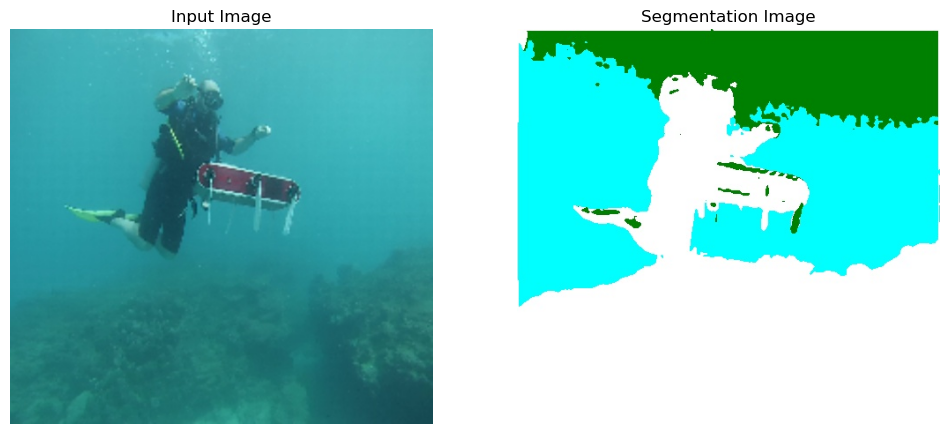

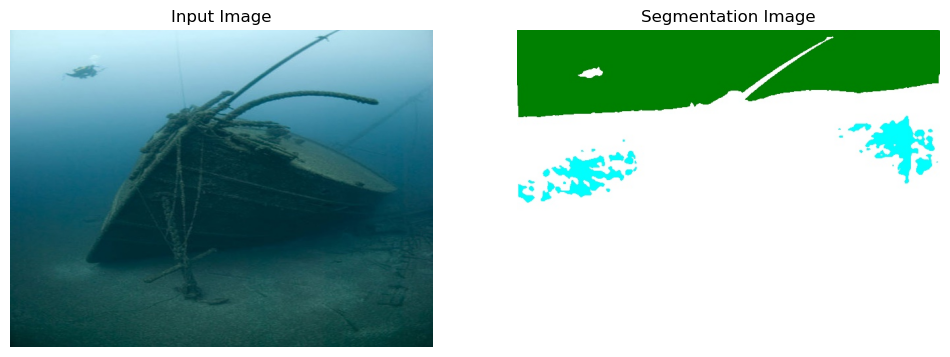

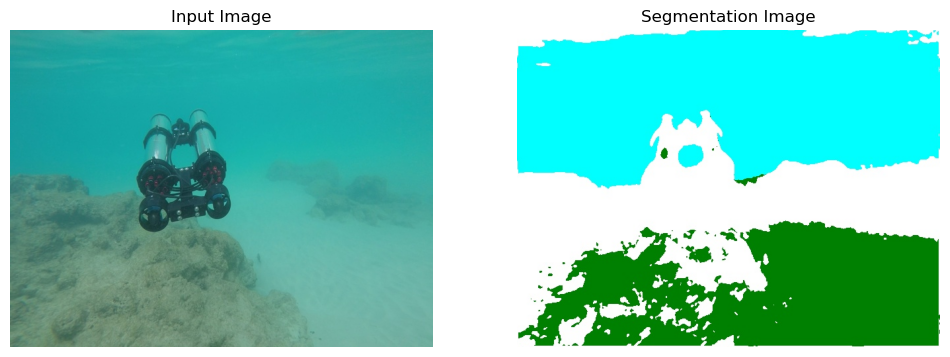

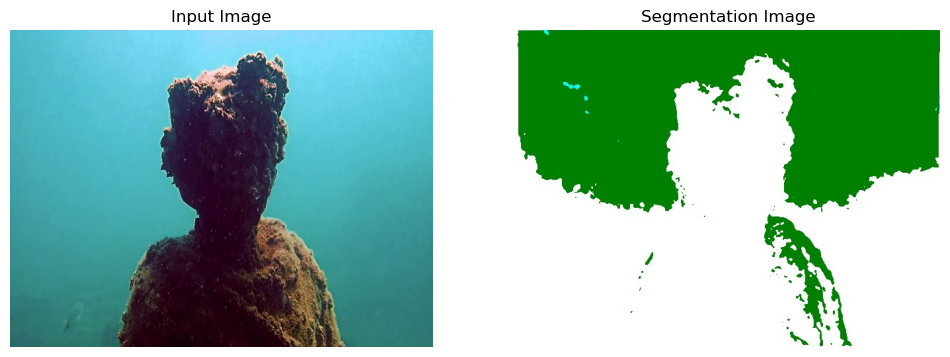

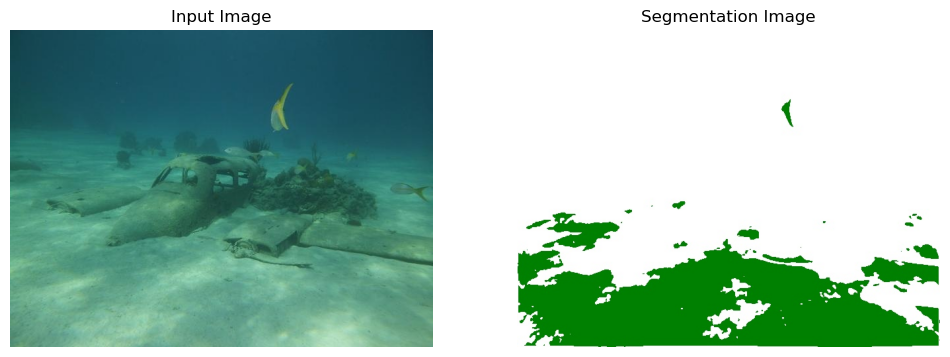

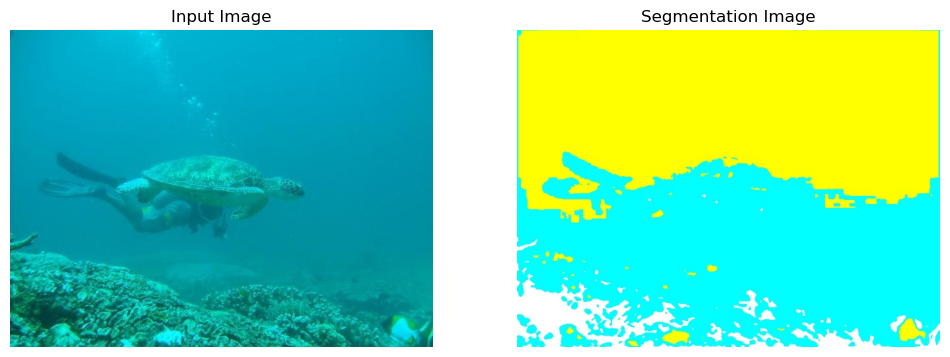

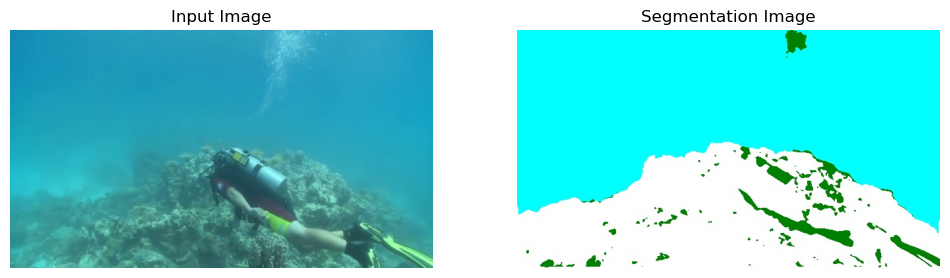

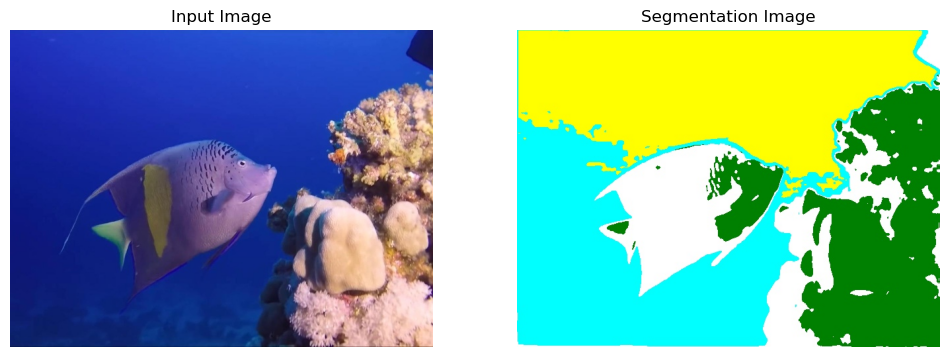

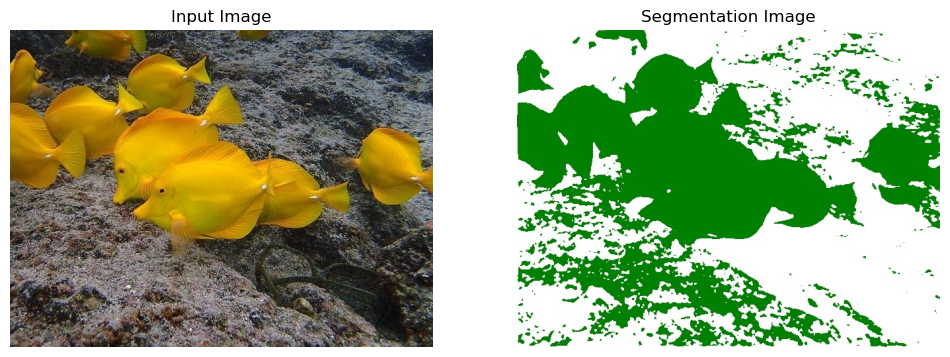

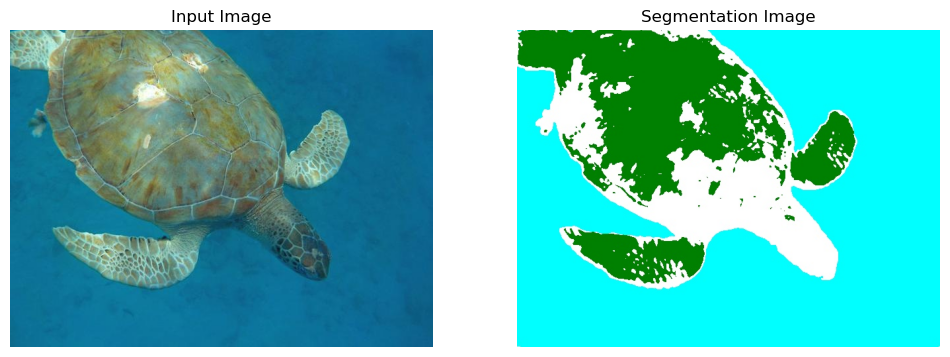

In [14]:
import matplotlib.pyplot as plt
import cv2
import os
import random

# Path to the folder containing the original input images
input_image_folder = '/home/admin1/student1/Joel/dataset/test'

# Path to the folder containing the segmentation images
segmentation_image_folder = '/home/admin1/student1/Joel/dataset/segmentation_images'

# List of input image files (assuming they have the same names as segmentation images)
input_image_files = os.listdir(input_image_folder)

# Number of images to display (change this number as needed)
num_images_to_display = 10

# Randomly select 'num_images_to_display' images to visualize
selected_image_files = random.sample(input_image_files, num_images_to_display)

# Loop through the selected input images and corresponding segmentation images
for input_image_file in selected_image_files:
    # Load the input image
    input_image_path = os.path.join(input_image_folder, input_image_file)
    input_image = cv2.imread(input_image_path)

    # Load the segmentation image
    segmentation_image_path = os.path.join(segmentation_image_folder, input_image_file)
    segmentation_image = cv2.imread(segmentation_image_path)

    # Create a subplot with 1 row and 2 columns
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the original input image on the left
    axes[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Input Image')
    axes[0].axis('off')

    # Plot the segmentation image on the right
    axes[1].imshow(cv2.cvtColor(segmentation_image, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Segmentation Image')
    axes[1].axis('off')

    # Show the subplot
    plt.show()


In [15]:
# detect in the segmentation images the plugs --> new segmentation images function

In [16]:
# Apply erosion
kernel = np.ones((3, 3), np.uint8)
eroded_mask = cv2.erode(segmentation_image, kernel, iterations=1)

In [17]:
'''
# Apply dilation
kernel = np.ones((3, 3), np.uint8)
dilated_mask = cv2.dilate(segmentation_image, kernel, iterations=1)
'''

'\n# Apply dilation\nkernel = np.ones((3, 3), np.uint8)\ndilated_mask = cv2.dilate(segmentation_image, kernel, iterations=1)\n'

In [18]:
'''
# Apply opening
kernel = np.ones((3, 3), np.uint8)
opened_mask = cv2.morphologyEx(segmentation_image, cv2.MORPH_OPEN, kernel)
'''

'\n# Apply opening\nkernel = np.ones((3, 3), np.uint8)\nopened_mask = cv2.morphologyEx(segmentation_image, cv2.MORPH_OPEN, kernel)\n'

In [19]:
'''
# Apply closing
kernel = np.ones((3, 3), np.uint8)
closed_mask = cv2.morphologyEx(segmentation_image, cv2.MORPH_CLOSE, kernel)
'''

'\n# Apply closing\nkernel = np.ones((3, 3), np.uint8)\nclosed_mask = cv2.morphologyEx(segmentation_image, cv2.MORPH_CLOSE, kernel)\n'

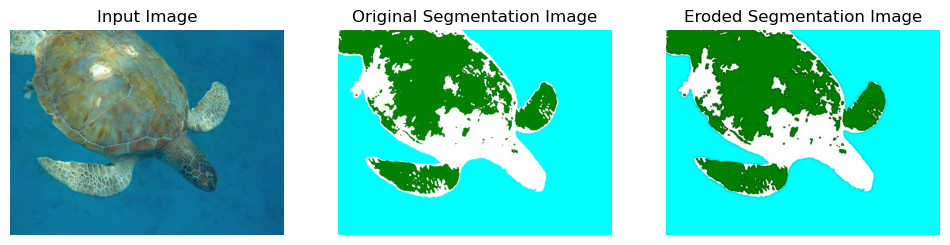

In [20]:
# Create a subplot with 1 row and 3 columns
fig, axes = plt.subplots(1, 3, figsize=(12, 6))

# Plot the input image on the left
axes[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Input Image')
axes[0].axis('off')

# Plot the original segmentation image in the middle
axes[1].imshow(cv2.cvtColor(segmentation_image, cv2.COLOR_BGR2RGB))
axes[1].set_title('Original Segmentation Image')
axes[1].axis('off')

# Plot the eroded segmentation image on the right
axes[2].imshow(cv2.cvtColor(eroded_mask, cv2.COLOR_BGR2RGB))
axes[2].set_title('Eroded Segmentation Image')
axes[2].axis('off')

# Show the plot
plt.show()


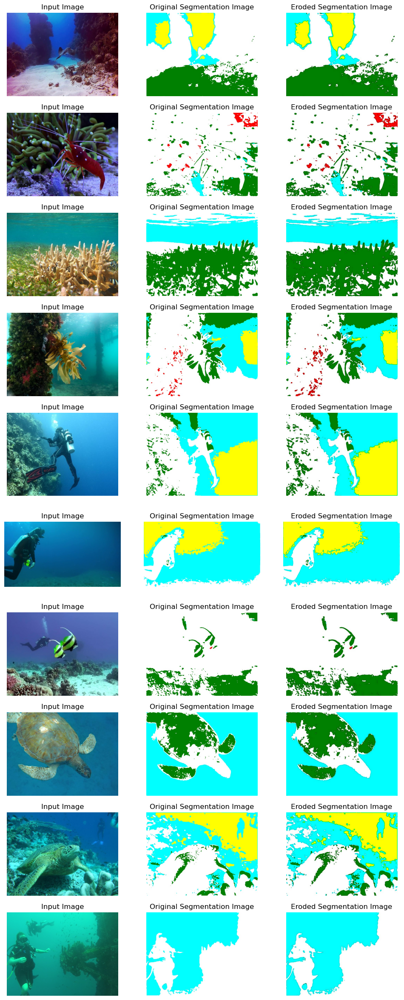

In [21]:
import matplotlib.pyplot as plt
import cv2
import os
import random
import numpy as np

# Path to the folder containing the original input images
input_image_folder = '/home/admin1/student1/Joel/dataset/test'

# Path to the folder containing the segmentation images
segmentation_image_folder = '/home/admin1/student1/Joel/dataset/segmentation_images'

# List of input image files (assuming they have the same names as segmentation images)
input_image_files = os.listdir(input_image_folder)

# Number of images to display (change this number as needed)
num_images_to_display = 10

# Randomly select 'num_images_to_display' images to visualize
selected_image_files = random.sample(input_image_files, num_images_to_display)

# Create a subplot with 10 rows and 3 columns
fig, axes = plt.subplots(10, 3, figsize=(12, 30))

for i, input_image_file in enumerate(selected_image_files):
    # Load the input image
    input_image_path = os.path.join(input_image_folder, input_image_file)
    input_image = cv2.imread(input_image_path)

    # Load the segmentation image
    segmentation_image_path = os.path.join(segmentation_image_folder, input_image_file)
    segmentation_image = cv2.imread(segmentation_image_path)

    # Apply erosion
    kernel = np.ones((3, 3), np.uint8)
    eroded_mask = cv2.erode(segmentation_image, kernel, iterations=1)

    # Create a subplot for the original input image
    axes[i, 0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title('Input Image')
    axes[i, 0].axis('off')

    # Create a subplot for the original segmentation image
    axes[i, 1].imshow(cv2.cvtColor(segmentation_image, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title('Original Segmentation Image')
    axes[i, 1].axis('off')

    # Create a subplot for the eroded segmentation image
    axes[i, 2].imshow(cv2.cvtColor(eroded_mask, cv2.COLOR_BGR2RGB))
    axes[i, 2].set_title('Eroded Segmentation Image')
    axes[i, 2].axis('off')

# Show the plot
plt.show()


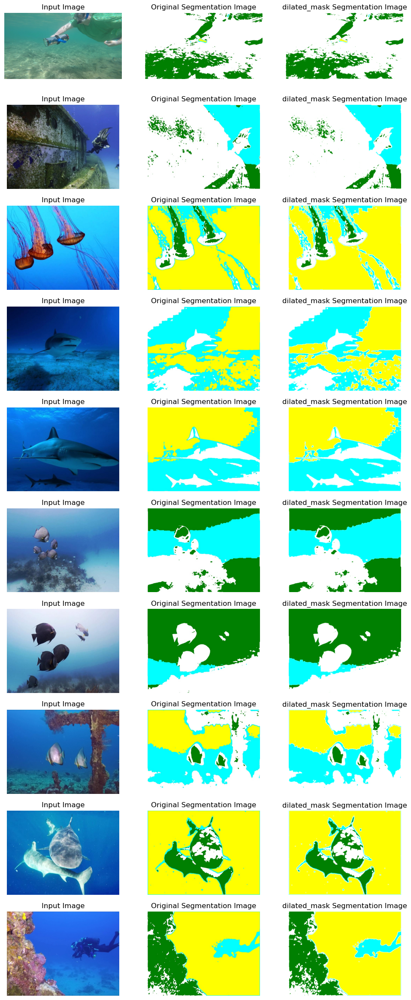

In [22]:
import matplotlib.pyplot as plt
import cv2
import os
import random
import numpy as np

# Path to the folder containing the original input images
input_image_folder = '/home/admin1/student1/Joel/dataset/test'

# Path to the folder containing the segmentation images
segmentation_image_folder = '/home/admin1/student1/Joel/dataset/segmentation_images'

# List of input image files (assuming they have the same names as segmentation images)
input_image_files = os.listdir(input_image_folder)

# Number of images to display (change this number as needed)
num_images_to_display = 10

# Randomly select 'num_images_to_display' images to visualize
selected_image_files = random.sample(input_image_files, num_images_to_display)

# Create a subplot with 10 rows and 3 columns
fig, axes = plt.subplots(10, 3, figsize=(12, 30))

for i, input_image_file in enumerate(selected_image_files):
    # Load the input image
    input_image_path = os.path.join(input_image_folder, input_image_file)
    input_image = cv2.imread(input_image_path)

    # Load the segmentation image
    segmentation_image_path = os.path.join(segmentation_image_folder, input_image_file)
    segmentation_image = cv2.imread(segmentation_image_path)

    # Apply dilation
    kernel = np.ones((3, 3), np.uint8)
    dilated_mask = cv2.dilate(segmentation_image, kernel, iterations=1)

    # Create a subplot for the original input image
    axes[i, 0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title('Input Image')
    axes[i, 0].axis('off')

    # Create a subplot for the original segmentation image
    axes[i, 1].imshow(cv2.cvtColor(segmentation_image, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title('Original Segmentation Image')
    axes[i, 1].axis('off')

    # Create a subplot for the eroded segmentation image
    axes[i, 2].imshow(cv2.cvtColor(dilated_mask, cv2.COLOR_BGR2RGB))
    axes[i, 2].set_title('dilated_mask Segmentation Image')
    axes[i, 2].axis('off')

# Show the plot
plt.show()


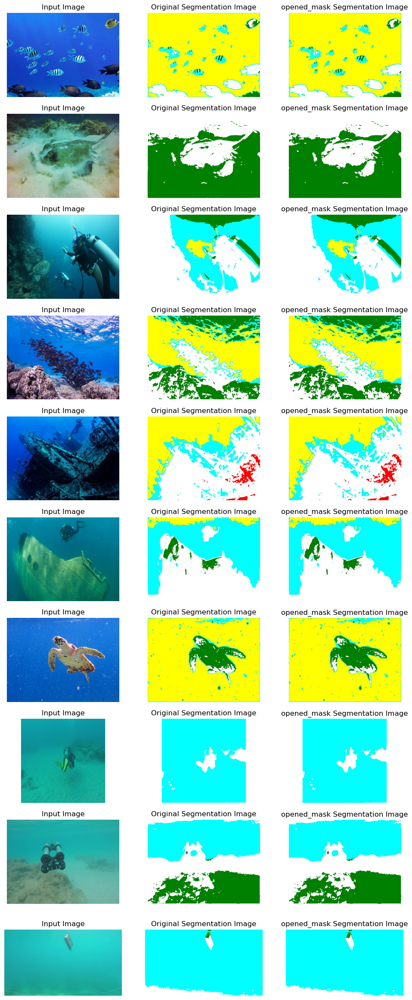

In [23]:
import matplotlib.pyplot as plt
import cv2
import os
import random
import numpy as np

# Path to the folder containing the original input images
input_image_folder = '/home/admin1/student1/Joel/dataset/test'

# Path to the folder containing the segmentation images
segmentation_image_folder = '/home/admin1/student1/Joel/dataset/segmentation_images'

# List of input image files (assuming they have the same names as segmentation images)
input_image_files = os.listdir(input_image_folder)

# Number of images to display (change this number as needed)
num_images_to_display = 10

# Randomly select 'num_images_to_display' images to visualize
selected_image_files = random.sample(input_image_files, num_images_to_display)

# Create a subplot with 10 rows and 3 columns
fig, axes = plt.subplots(10, 3, figsize=(12, 30))

for i, input_image_file in enumerate(selected_image_files):
    # Load the input image
    input_image_path = os.path.join(input_image_folder, input_image_file)
    input_image = cv2.imread(input_image_path)

    # Load the segmentation image
    segmentation_image_path = os.path.join(segmentation_image_folder, input_image_file)
    segmentation_image = cv2.imread(segmentation_image_path)

    # Apply opening
    kernel = np.ones((3, 3), np.uint8)
    opened_mask = cv2.morphologyEx(segmentation_image, cv2.MORPH_OPEN, kernel)

    # Create a subplot for the original input image
    axes[i, 0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title('Input Image')
    axes[i, 0].axis('off')

    # Create a subplot for the original segmentation image
    axes[i, 1].imshow(cv2.cvtColor(segmentation_image, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title('Original Segmentation Image')
    axes[i, 1].axis('off')

    # Create a subplot for the eroded segmentation image
    axes[i, 2].imshow(cv2.cvtColor(opened_mask, cv2.COLOR_BGR2RGB))
    axes[i, 2].set_title('opened_mask Segmentation Image')
    axes[i, 2].axis('off')

# Show the plot
plt.show()


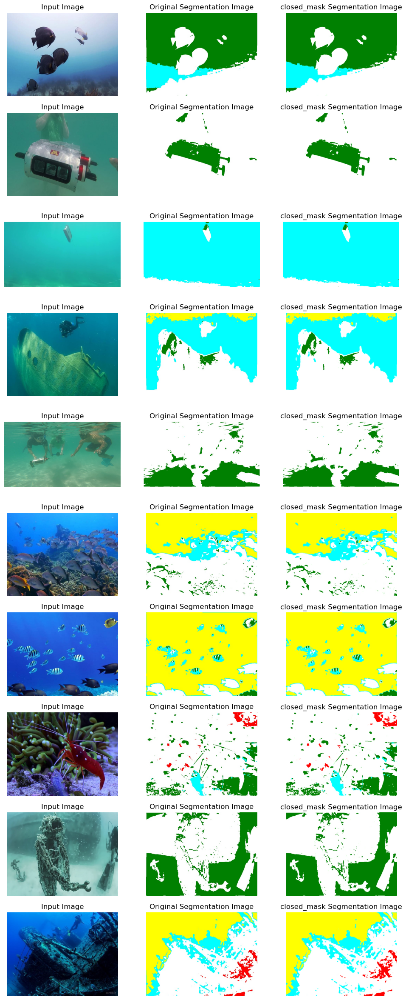

In [24]:
import matplotlib.pyplot as plt
import cv2
import os
import random
import numpy as np

# Path to the folder containing the original input images
input_image_folder = '/home/admin1/student1/Joel/dataset/test'

# Path to the folder containing the segmentation images
segmentation_image_folder = '/home/admin1/student1/Joel/dataset/segmentation_images'

# List of input image files (assuming they have the same names as segmentation images)
input_image_files = os.listdir(input_image_folder)

# Number of images to display (change this number as needed)
num_images_to_display = 10

# Randomly select 'num_images_to_display' images to visualize
selected_image_files = random.sample(input_image_files, num_images_to_display)

# Create a subplot with 10 rows and 3 columns
fig, axes = plt.subplots(10, 3, figsize=(12, 30))

for i, input_image_file in enumerate(selected_image_files):
    # Load the input image
    input_image_path = os.path.join(input_image_folder, input_image_file)
    input_image = cv2.imread(input_image_path)

    # Load the segmentation image
    segmentation_image_path = os.path.join(segmentation_image_folder, input_image_file)
    segmentation_image = cv2.imread(segmentation_image_path)

    # Apply closing
    kernel = np.ones((3, 3), np.uint8)
    closed_mask = cv2.morphologyEx(segmentation_image, cv2.MORPH_CLOSE, kernel)

    # Create a subplot for the original input image
    axes[i, 0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title('Input Image')
    axes[i, 0].axis('off')

    # Create a subplot for the original segmentation image
    axes[i, 1].imshow(cv2.cvtColor(segmentation_image, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title('Original Segmentation Image')
    axes[i, 1].axis('off')

    # Create a subplot for the eroded segmentation image
    axes[i, 2].imshow(cv2.cvtColor(closed_mask, cv2.COLOR_BGR2RGB))
    axes[i, 2].set_title('closed_mask Segmentation Image')
    axes[i, 2].axis('off')

# Show the plot
plt.show()


In [25]:
import numpy as np

def calculate_iou(gt_mask, pred_mask, num_classes):
    iou_list = []

    for class_id in range(num_classes):
        intersection = np.logical_and(gt_mask == class_id, pred_mask == class_id)
        union = np.logical_or(gt_mask == class_id, pred_mask == class_id)

        iou = np.sum(intersection) / np.sum(union)
        iou_list.append(iou)

    mIoU = np.mean(iou_list)
    return mIoU


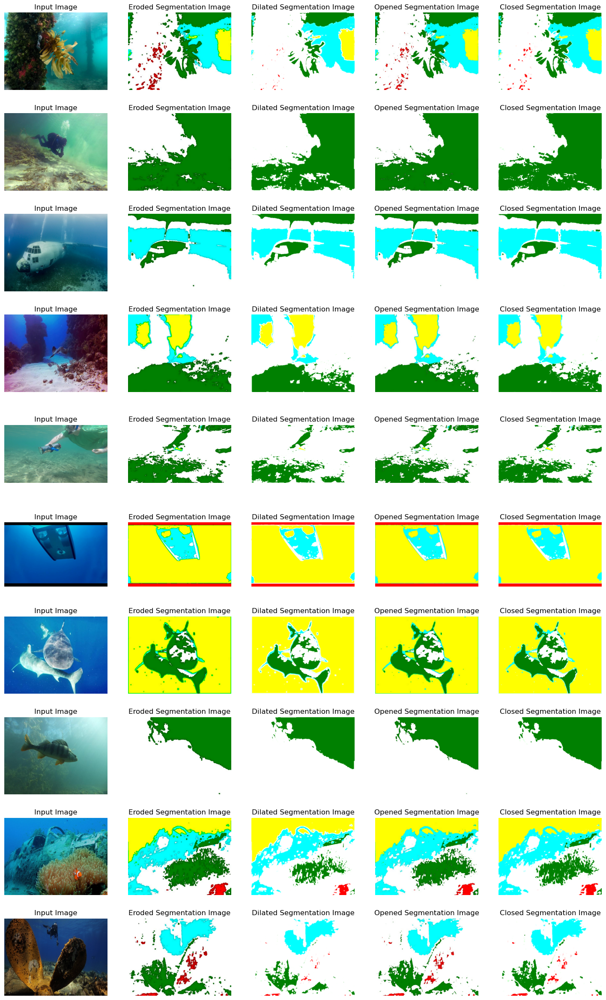

In [26]:
import matplotlib.pyplot as plt
import cv2
import os
import random
import numpy as np

# Path to the folder containing the original input images
input_image_folder = '/home/admin1/student1/Joel/dataset/test'

# Path to the folder containing the segmentation images
segmentation_image_folder = '/home/admin1/student1/Joel/dataset/segmentation_images'

# List of input image files (assuming they have the same names as segmentation images)
input_image_files = os.listdir(input_image_folder)

# Number of images to display (change this number as needed)
num_images_to_display = 10

# Randomly select 'num_images_to_display' images to visualize
selected_image_files = random.sample(input_image_files, num_images_to_display)

# Create a subplot with 10 rows and 4 columns (for original, eroded, dilated, opened, closed)
fig, axes = plt.subplots(10, 5, figsize=(18, 30))

for i, input_image_file in enumerate(selected_image_files):
    # Load the input image
    input_image_path = os.path.join(input_image_folder, input_image_file)
    input_image = cv2.imread(input_image_path)

    # Load the segmentation image
    segmentation_image_path = os.path.join(segmentation_image_folder, input_image_file)
    segmentation_image = cv2.imread(segmentation_image_path)

    # Apply erosion
    kernel = np.ones((5, 5), np.uint8)
    eroded_mask = cv2.erode(segmentation_image, kernel, iterations=1)

    # Apply dilation
    dilated_mask = cv2.dilate(segmentation_image, kernel, iterations=1)

    # Apply opening (erosion followed by dilation)
    opened_mask = cv2.morphologyEx(segmentation_image, cv2.MORPH_OPEN, kernel)

    # Apply closing (dilation followed by erosion)
    closed_mask = cv2.morphologyEx(segmentation_image, cv2.MORPH_CLOSE, kernel)

    # Create subplots for different morphological operations
    axes[i, 0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title('Input Image')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(cv2.cvtColor(eroded_mask, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title('Eroded Segmentation Image')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(cv2.cvtColor(dilated_mask, cv2.COLOR_BGR2RGB))
    axes[i, 2].set_title('Dilated Segmentation Image')
    axes[i, 2].axis('off')

    axes[i, 3].imshow(cv2.cvtColor(opened_mask, cv2.COLOR_BGR2RGB))
    axes[i, 3].set_title('Opened Segmentation Image')
    axes[i, 3].axis('off')

    axes[i, 4].imshow(cv2.cvtColor(closed_mask, cv2.COLOR_BGR2RGB))
    axes[i, 4].set_title('Closed Segmentation Image')
    axes[i, 4].axis('off')

# Show the plot
plt.show()


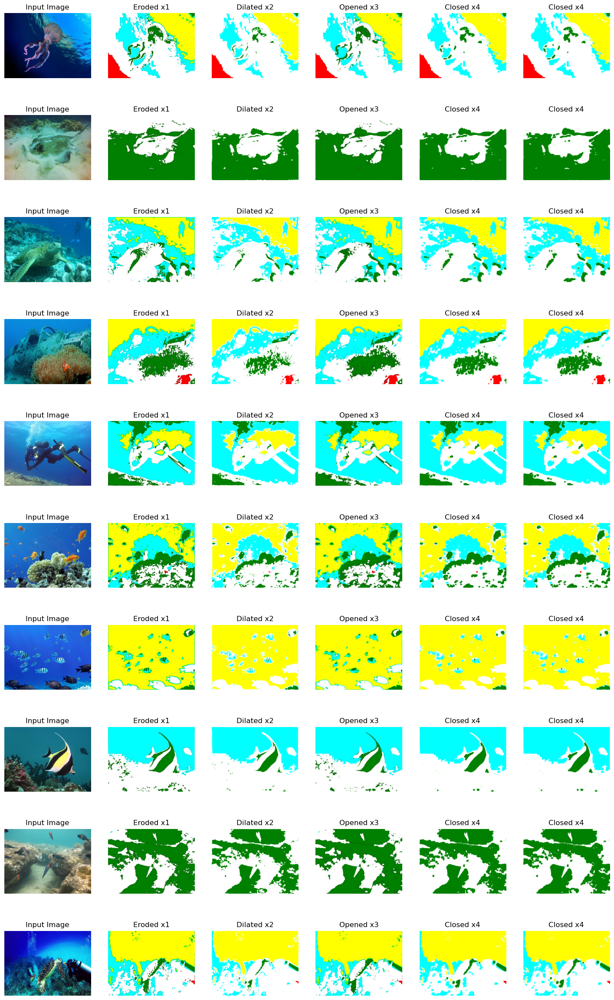

In [27]:
import matplotlib.pyplot as plt
import cv2
import os
import random
import numpy as np

# Path to the folder containing the original input images
input_image_folder = '/home/admin1/student1/Joel/dataset/test'

# Path to the folder containing the segmentation images
segmentation_image_folder = '/home/admin1/student1/Joel/dataset/segmentation_images'

# List of input image files (assuming they have the same names as segmentation images)
input_image_files = os.listdir(input_image_folder)

# Number of images to display (change this number as needed)
num_images_to_display = 10

# Randomly select 'num_images_to_display' images to visualize
selected_image_files = random.sample(input_image_files, num_images_to_display)

# Create a subplot with 10 rows and N columns (for original, eroded, dilated, opened, closed)
N = 6  # Number of columns for each image
fig, axes = plt.subplots(10, N, figsize=(18, 30))

for i, input_image_file in enumerate(selected_image_files):
    # Load the input image
    input_image_path = os.path.join(input_image_folder, input_image_file)
    input_image = cv2.imread(input_image_path)

    # Load the segmentation image
    segmentation_image_path = os.path.join(segmentation_image_folder, input_image_file)
    segmentation_image = cv2.imread(segmentation_image_path)

    # Create subplots for different morphological operations
    axes[i, 0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title('Input Image')
    axes[i, 0].axis('off')

    # Apply morphological operations multiple times
    for j in range(1, N):
        iterations = j  # Number of iterations (change as needed)
        kernel = np.ones((3, 3), np.uint8)

        if j == 1:
            processed_image = cv2.erode(segmentation_image, kernel, iterations=iterations)
            operation_name = f'Eroded x{iterations}'
        elif j == 2:
            processed_image = cv2.dilate(segmentation_image, kernel, iterations=iterations)
            operation_name = f'Dilated x{iterations}'
        elif j == 3:
            processed_image = cv2.morphologyEx(segmentation_image, cv2.MORPH_OPEN, kernel, iterations=iterations)
            operation_name = f'Opened x{iterations}'
        elif j == 4:
            processed_image = cv2.morphologyEx(segmentation_image, cv2.MORPH_CLOSE, kernel, iterations=iterations)
            operation_name = f'Closed x{iterations}'

        axes[i, j].imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
        axes[i, j].set_title(operation_name)
        axes[i, j].axis('off')

# Show the plot
plt.show()


In [28]:
'''
import cv2
import numpy as np
import os

def calculate_iou(segmented_image, ground_truth_image, num_classes):
    # Resize the images to a common size (e.g., 640x480)
    segmented_image = cv2.resize(segmented_image, (640, 480))
    ground_truth_image = cv2.resize(ground_truth_image, (640, 480))

    iou_list = []

    for class_id in range(num_classes):
        # Create binary masks for the current class
        seg_mask = (segmented_image == class_id)
        gt_mask = (ground_truth_image == class_id)

        # Calculate intersection and union
        intersection = np.logical_and(seg_mask, gt_mask)
        union = np.logical_or(seg_mask, gt_mask)

        iou = np.sum(intersection) / (np.sum(union) + 1e-5)  # Avoid division by zero
        iou_list.append(iou)

    mIoU = np.mean(iou_list)
    return mIoU

def calculate_mIoU_for_folder(segmented_folder, ground_truth_folder, num_classes):
    segmented_images = os.listdir(segmented_folder)
    ground_truth_images = os.listdir(ground_truth_folder)

    if len(segmented_images) != len(ground_truth_images):
        raise ValueError("Number of segmented images and ground truth images should match.")

    mIoU_list = []

    for segmented_image_file, ground_truth_image_file in zip(segmented_images, ground_truth_images):
        segmented_image_path = os.path.join(segmented_folder, segmented_image_file)
        ground_truth_image_path = os.path.join(ground_truth_folder, ground_truth_image_file)

        segmented_image = cv2.imread(segmented_image_path, cv2.IMREAD_GRAYSCALE)
        ground_truth_image = cv2.imread(ground_truth_image_path, cv2.IMREAD_GRAYSCALE)

        mIoU = calculate_iou(segmented_image, ground_truth_image, num_classes)
        mIoU_list.append(mIoU)

    mean_mIoU = np.mean(mIoU_list)
    return mean_mIoU

# Specify the paths to the segmented and ground truth image folders
segmented_folder = '/content/drive/MyDrive/pytorch-unsupervised-segmentation-tip-master/pytorch-unsupervised-segmentation-tip-master/dataset/segmentation_images'
ground_truth_folder = '/content/drive/MyDrive/pytorch-unsupervised-segmentation-tip-master/pytorch-unsupervised-segmentation-tip-master/dataset/Mask_test_jpg'

num_classes = 8  # Number of classes in your segmentation

mIoU = calculate_mIoU_for_folder(segmented_folder, ground_truth_folder, num_classes)
print(f"Mean IoU for the folder: {mIoU}")
'''

'\nimport cv2\nimport numpy as np\nimport os\n\ndef calculate_iou(segmented_image, ground_truth_image, num_classes):\n    # Resize the images to a common size (e.g., 640x480)\n    segmented_image = cv2.resize(segmented_image, (640, 480))\n    ground_truth_image = cv2.resize(ground_truth_image, (640, 480))\n\n    iou_list = []\n\n    for class_id in range(num_classes):\n        # Create binary masks for the current class\n        seg_mask = (segmented_image == class_id)\n        gt_mask = (ground_truth_image == class_id)\n\n        # Calculate intersection and union\n        intersection = np.logical_and(seg_mask, gt_mask)\n        union = np.logical_or(seg_mask, gt_mask)\n\n        iou = np.sum(intersection) / (np.sum(union) + 1e-5)  # Avoid division by zero\n        iou_list.append(iou)\n\n    mIoU = np.mean(iou_list)\n    return mIoU\n\ndef calculate_mIoU_for_folder(segmented_folder, ground_truth_folder, num_classes):\n    segmented_images = os.listdir(segmented_folder)\n    ground_t

In [29]:
import os
import numpy as np
from PIL import Image

def calculate_iou(pred, target):
    intersection = np.logical_and(target, pred)
    union = np.logical_or(target, pred)
    iou = np.sum(intersection) / np.sum(union)
    return iou

def calculate_miou(pred_folder, target_folder):
    pred_images = os.listdir(pred_folder)
    target_images = os.listdir(target_folder)

    num_images = len(pred_images)
    miou_sum = 0.0

    for i in range(num_images):
        pred_path = os.path.join(pred_folder, pred_images[i])
        target_path = os.path.join(target_folder, target_images[i])

        pred_image = np.array(Image.open(pred_path))
        target_image = np.array(Image.open(target_path))

        # Convert to binary masks (0 or 1)
        pred_mask = (pred_image > 0).astype(np.uint8)
        target_mask = (target_image > 0).astype(np.uint8)

        iou = calculate_iou(pred_mask, target_mask)
        miou_sum += iou

    miou = miou_sum / num_images
    return miou

# Example usage:
# Replace 'path/to/pred_folder' and 'path/to/target_folder' with the actual paths to your folders
pred_folder = "/home/admin1/student1/Joel/dataset/segmentation_images"
target_folder = "/home/admin1/student1/Joel/dataset/Mask_test_jpg"

miou = calculate_miou(pred_folder, target_folder)
print("mIoU:", miou)

mIoU: 0.4454513451862974
